### Module 2

In [3]:
from pathlib import Path

parent_dir = Path().resolve().parent 
data_path = parent_dir/"data/module2"   
result_path = parent_dir/"results/module2" 
result_path.mkdir(exist_ok=True)

Ex2.1

- Load the complex data "kspace.npy" using the np.load() routine. Determine which array dimension is the coil dimension.

- Create an image of the magnitude of k-space for each coil. \
    You can use np.log1p() to scale the kspace data for easier visualisation.

k-space data shape: (6, 280, 280)


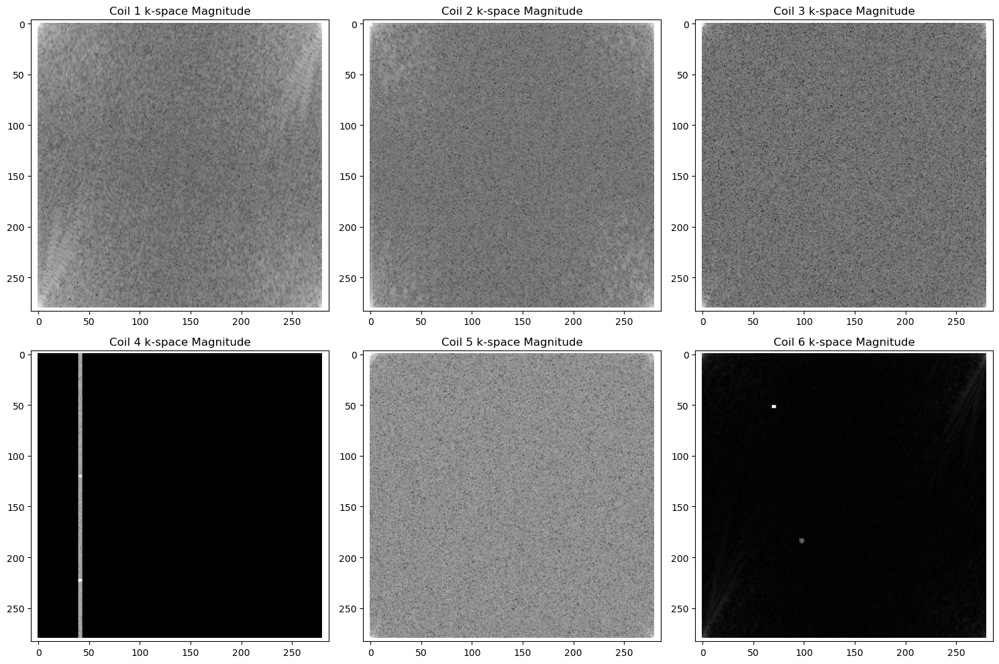

In [4]:
import numpy as np
import matplotlib.pyplot as plt

kdata = np.load(data_path/"kspace.npy")

print(f"k-space data shape: {kdata.shape}")

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i in range(kdata.shape[0]):
    coil = kdata[i, :, :]

    kmag = np.log1p(np.abs(coil))
    axes[i].imshow(kmag, cmap='gray')
    axes[i].set_title(f'Coil {i+1} k-space Magnitude')
    axes[i].axis('equal')

plt.tight_layout()
plt.show()


- Transpose the data into image space using the Fourier transform. Create and show a magnitude and phase image from one coil.

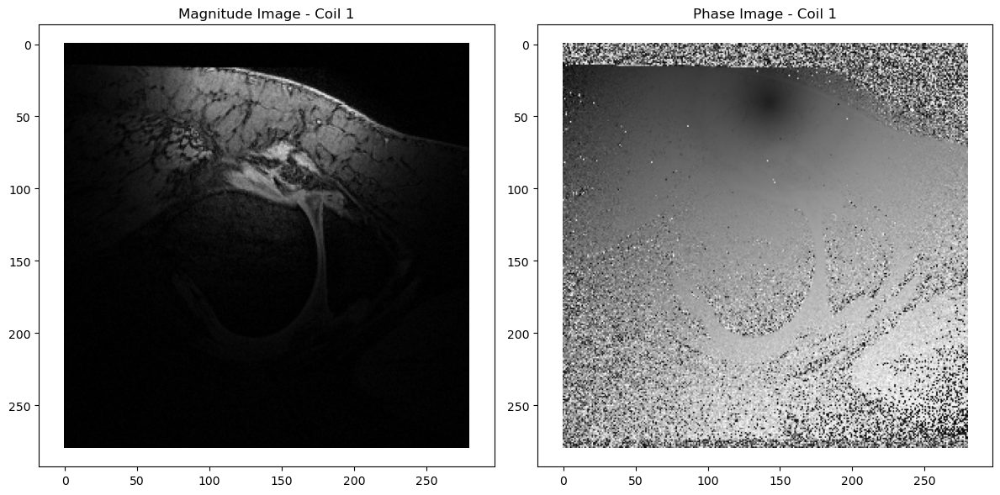

In [5]:
import numpy as np
import matplotlib.pyplot as plt

images = np.zeros_like(kdata, dtype=complex)

for i in range(kdata.shape[0]):
    images[i] = np.fft.ifft2(kdata[i])

# display magnitude and phase for the first coil
coil_image = images[0]

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# magnitude
axes[0].imshow(np.abs(coil_image), cmap='gray')
axes[0].set_title('Magnitude Image - Coil 1')
axes[0].axis('equal')

# phase
axes[1].imshow(np.angle(coil_image), cmap='gray')
axes[1].set_title('Phase Image - Coil 1')
axes[1].axis('equal')

plt.tight_layout()
plt.show()

- Show the magnitude images from all coils.

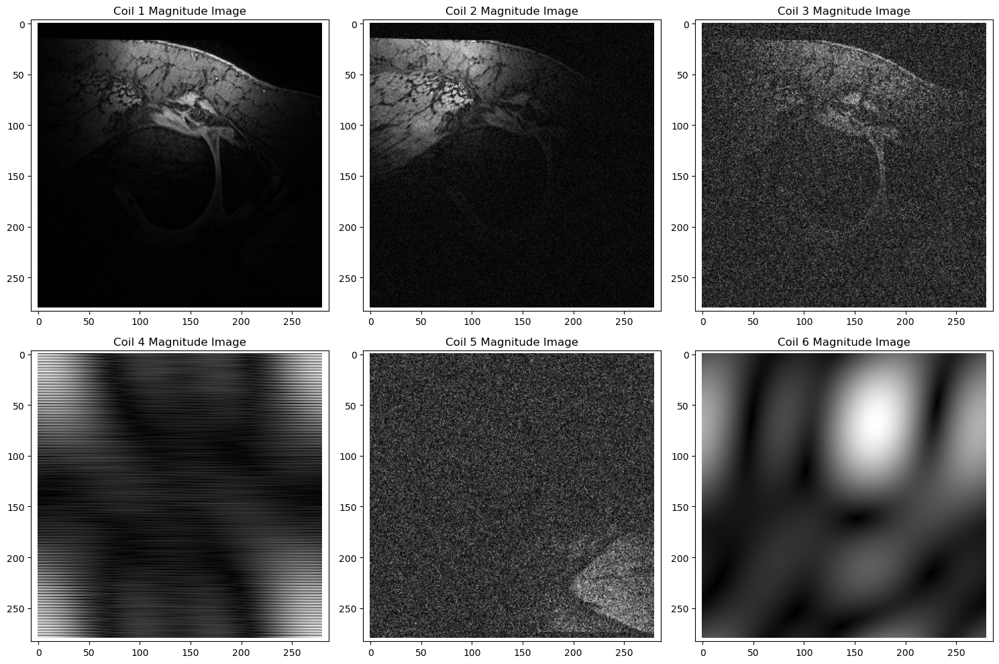

In [6]:
import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i in range(kdata.shape[0]):
    coil_image = images[i, :, :]
    
    axes[i].imshow(np.abs(coil_image), cmap='gray')
    axes[i].set_title(f'Coil {i+1} Magnitude Image')
    axes[i].axis('equal')

plt.tight_layout()
plt.show()

- Choose and appropriate way to combine the data from all of the coils into a single image (in image space). \
Do this by squaring the image from each coil, summing the magnitudes, and then taking the square root of the final result. Show this image.

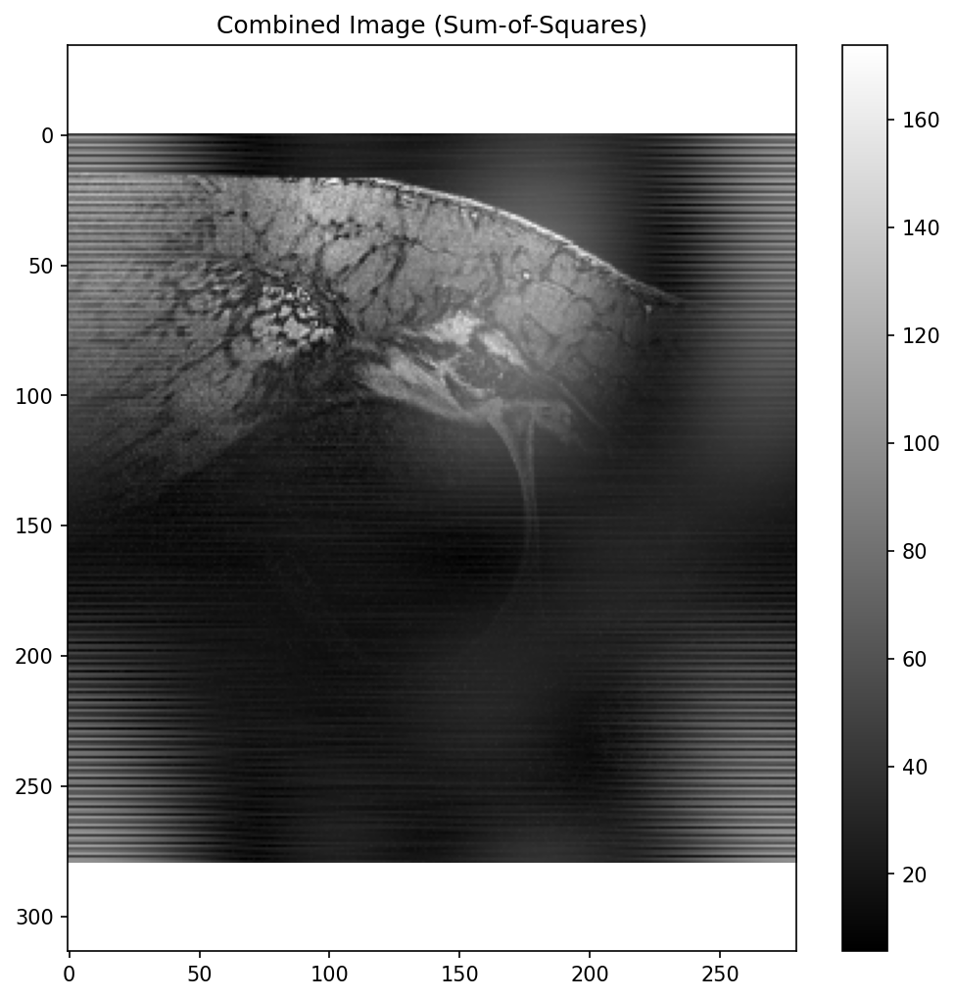

In [9]:
import numpy as np
import matplotlib.pyplot as plt

combined_image = np.zeros(images.shape[1:])

for i in range(kdata.shape[0]):
    coil_image = images[i, :, :]
    combined_image += np.abs(coil_image)**2

combined_image = np.sqrt(combined_image)

plt.figure(figsize=(8, 8), dpi=150)
plt.imshow(combined_image, cmap='gray')
plt.title('Combined Image (Sum-of-Squares)')
plt.axis('equal')
plt.colorbar()
plt.show()

Ex2.2

- Choose three denoising methods using the image space data, and show the effects of the denoising for all coils.\
Denoising methods can include mean, bilateral, wavelet, or any other filter.

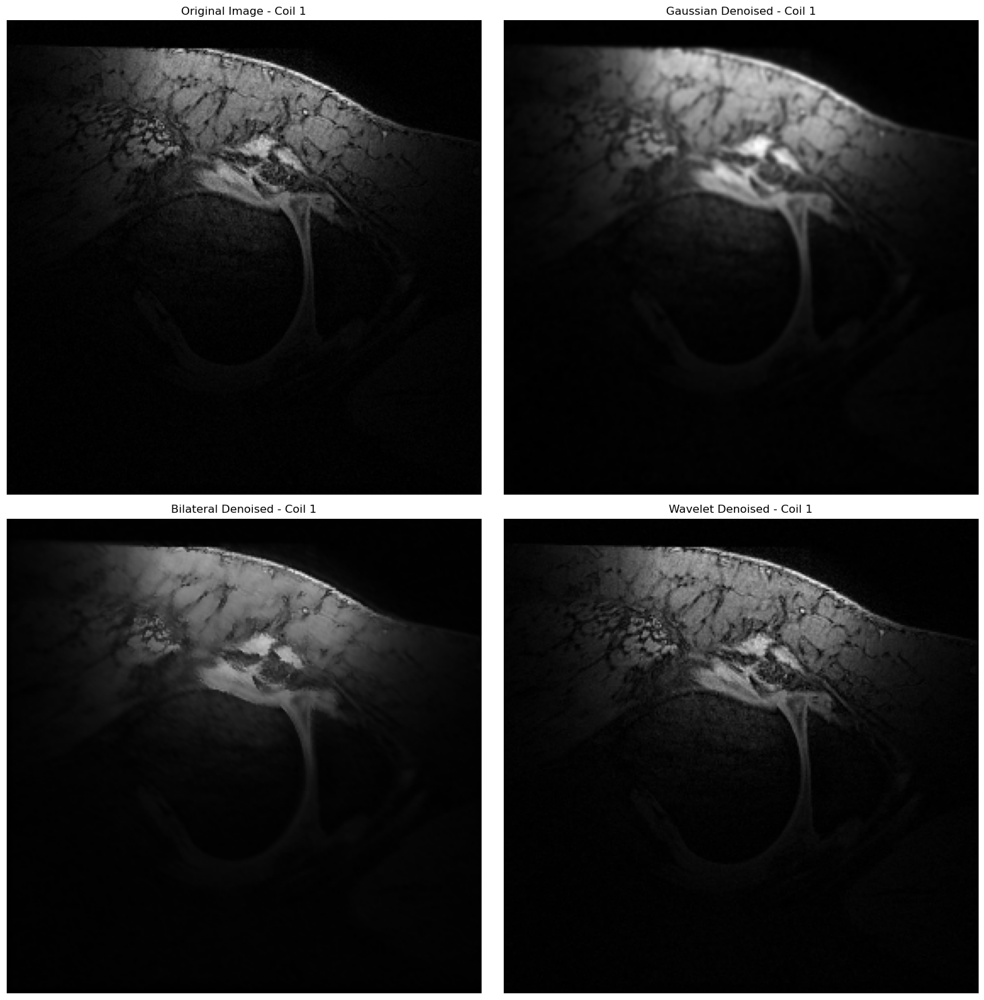

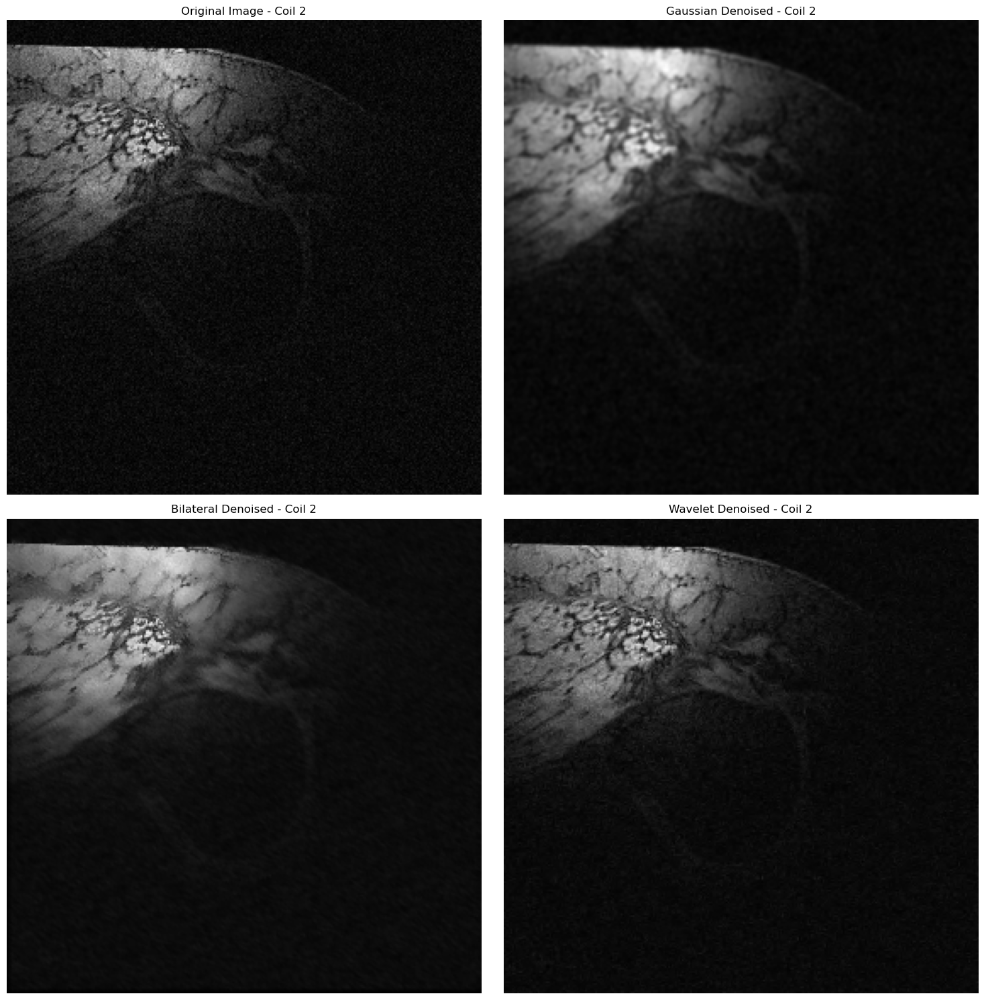

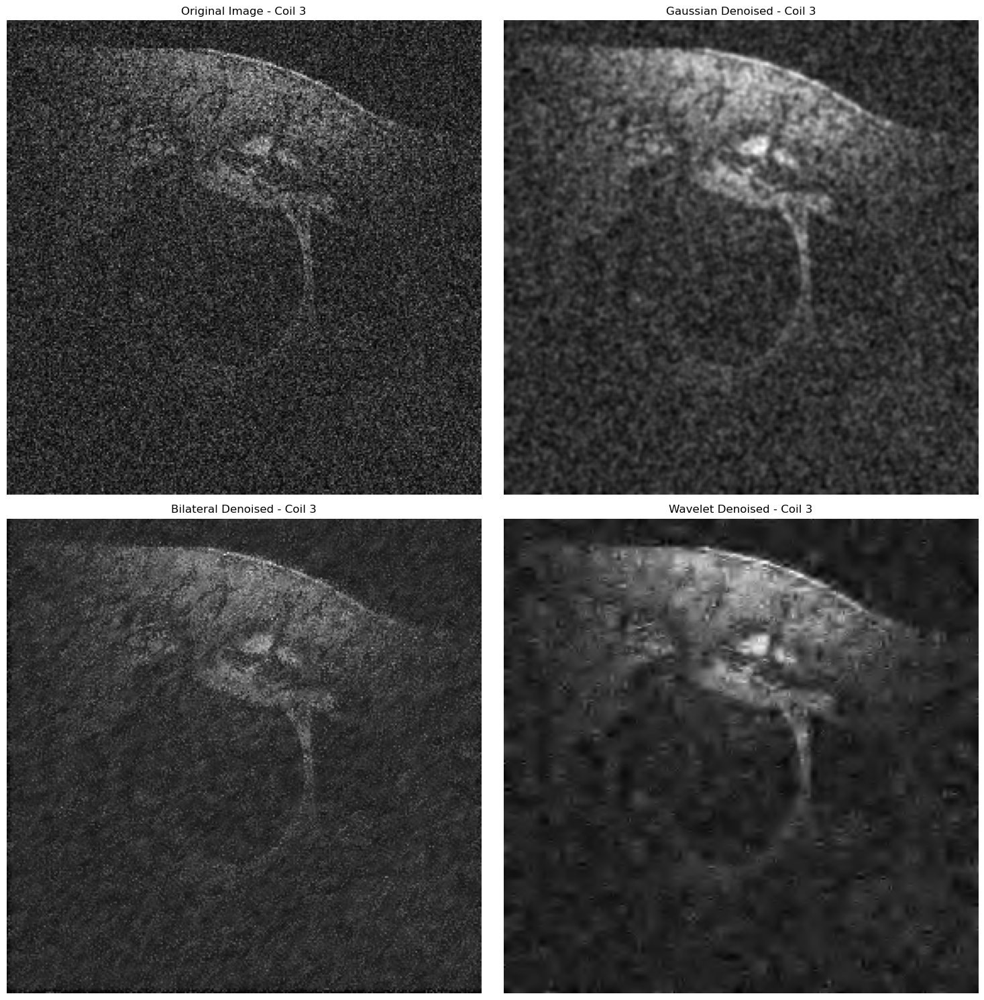

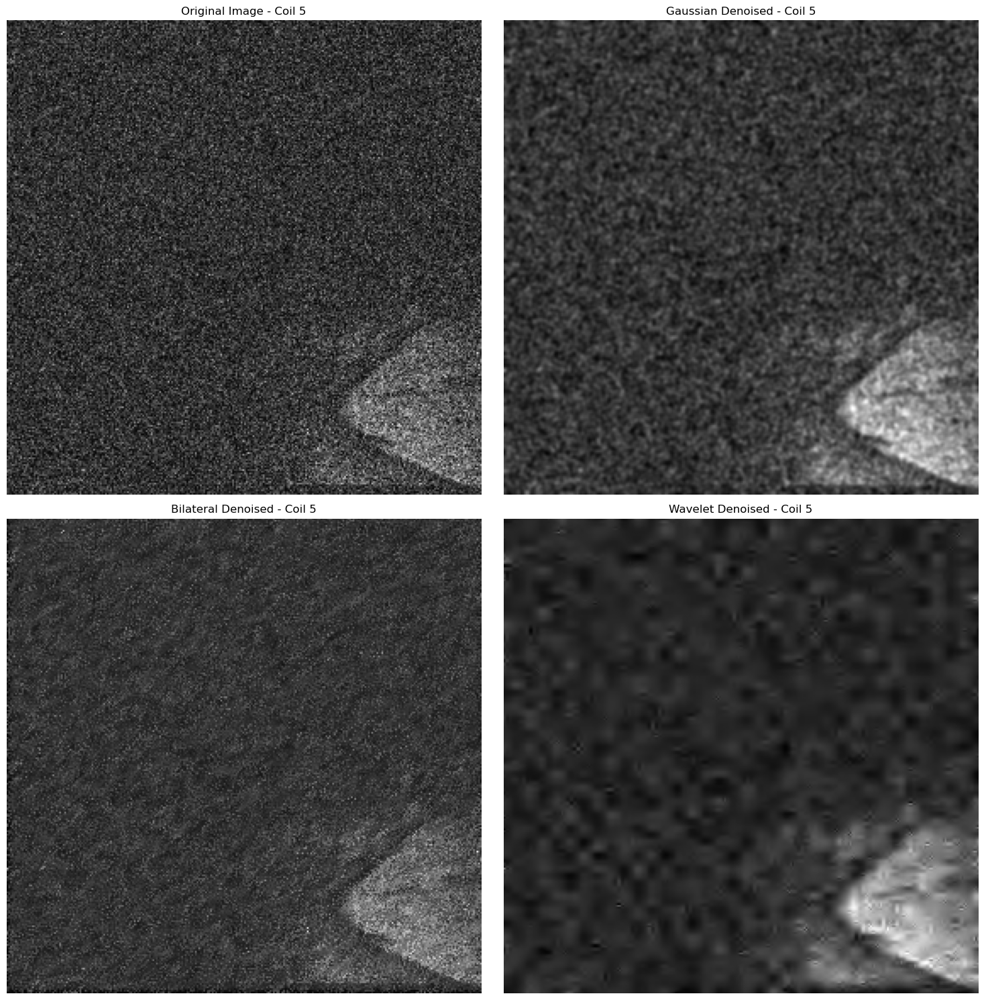

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from skimage.restoration import denoise_bilateral, denoise_wavelet

kdata = np.load(data_path/"kspace.npy")

images = np.zeros_like(kdata, dtype=complex)
for i in range(kdata.shape[0]):
    images[i] = np.fft.ifft2(kdata[i])

magnitudes = np.abs(images)

def bilateral_denoise(image):
    normalised_img = (image - np.min(image)) / (np.max(image) - np.min(image))
    denoised = denoise_bilateral(normalised_img, sigma_color=0.1, sigma_spatial=1)
    denoised = denoised * (np.max(image) - np.min(image)) + np.min(image)
    return denoised

def wavelet_denoise(image):
    normalised_img = (image - np.min(image)) / (np.max(image) - np.min(image))
    denoised = denoise_wavelet(normalised_img, wavelet='db4', mode='soft', wavelet_levels=3)
    denoised = denoised * (np.max(image) - np.min(image)) + np.min(image)
    return denoised

gaussian_denoised = np.zeros_like(magnitudes)
bilateral_denoised = np.zeros_like(magnitudes)
wavelet_denoised = np.zeros_like(magnitudes)

for i in range(kdata.shape[0]):
    gaussian_denoised[i] = gaussian_filter(magnitudes[i], sigma=1.0)
    bilateral_denoised[i] = bilateral_denoise(magnitudes[i])
    wavelet_denoised[i] = wavelet_denoise(magnitudes[i])

coils_to_show = [0, 1, 2, 4]   # skip brocken coils 4 and 6

for coil_idx in coils_to_show:
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    
    # original image
    axes[0, 0].imshow(magnitudes[coil_idx], cmap='gray')
    axes[0, 0].set_title(f'Original Image - Coil {coil_idx+1}')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(gaussian_denoised[coil_idx], cmap='gray')
    axes[0, 1].set_title(f'Gaussian Denoised - Coil {coil_idx+1}')
    axes[0, 1].axis('off')
    
    axes[1, 0].imshow(bilateral_denoised[coil_idx], cmap='gray')
    axes[1, 0].set_title(f'Bilateral Denoised - Coil {coil_idx+1}')
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(wavelet_denoised[coil_idx], cmap='gray')
    axes[1, 1].set_title(f'Wavelet Denoised - Coil {coil_idx+1}')
    axes[1, 1].axis('off')
    
    plt.tight_layout()
    plt.show()


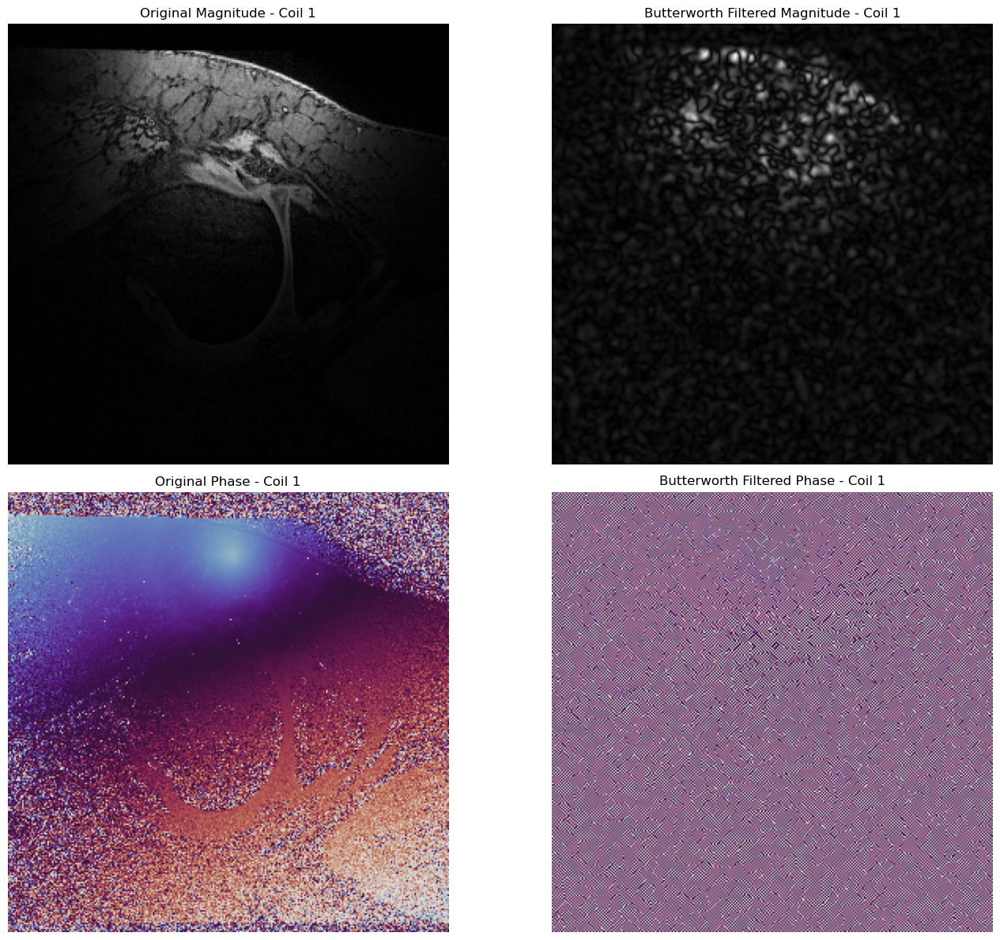

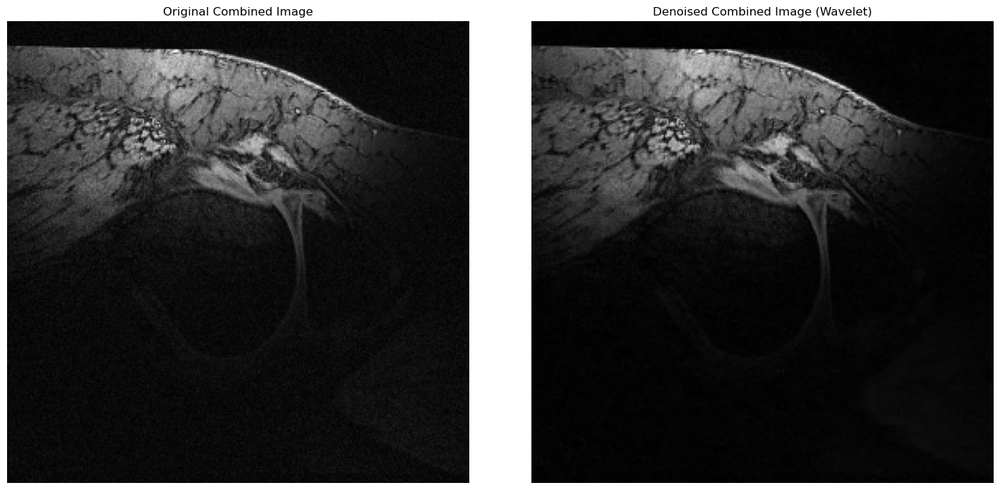

In [ ]:
from a2cw import butterworth_lowpass_filter

coil_idx = 0
filtered_kspace = kdata[coil_idx] * butterworth_lowpass_filter(kdata[coil_idx].shape)

# convey to image space
filtered_image = np.fft.ifft2(filtered_kspace)
filtered_magnitude = np.abs(filtered_image)
filtered_phase = np.angle(filtered_image)

fig, axes = plt.subplots(2, 2, figsize=(15, 12))

axes[0, 0].imshow(magnitudes[coil_idx], cmap='gray')
axes[0, 0].set_title('Original Magnitude - Coil 1')
axes[0, 0].axis('off')

axes[0, 1].imshow(filtered_magnitude, cmap='gray')
axes[0, 1].set_title('Butterworth Filtered Magnitude - Coil 1')
axes[0, 1].axis('off')

axes[1, 0].imshow(np.angle(images[coil_idx]), cmap='twilight')
axes[1, 0].set_title('Original Phase - Coil 1')
axes[1, 0].axis('off')

axes[1, 1].imshow(filtered_phase, cmap='twilight')
axes[1, 1].set_title('Butterworth Filtered Phase - Coil 1')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

## ----------------- use wavelet method to recreate the new combined image ----------------- ##
denoised_combined = np.zeros(wavelet_denoised.shape[1:])

for i in range(kdata.shape[0]):
    if i not in [3, 5]:  # skip brocken coils
        denoised_combined += wavelet_denoised[i]**2

# combine
denoised_combined = np.sqrt(denoised_combined)

original_combined = np.zeros(magnitudes.shape[1:])
for i in range(kdata.shape[0]):
    if i not in [3, 5]: 
        original_combined += magnitudes[i]**2
original_combined = np.sqrt(original_combined)

fig, axes = plt.subplots(1, 2, figsize=(15, 7))

axes[0].imshow(original_combined, cmap='gray')
axes[0].set_title('Original Combined Image')
axes[0].axis('off')

axes[1].imshow(denoised_combined, cmap='gray')
axes[1].set_title('Denoised Combined Image (Wavelet)')
axes[1].axis('off')

plt.tight_layout()
plt.show()